# Clustering and dimeonsionality reduction techniques combined

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Create synthetic data using Scikit learn `make_blob` method

- Number of features: 8
- Number of clusters: 5
- Number of samples: 1000

In [2]:
from sklearn.datasets import make_classification
from sklearn.datasets import make_blobs

In [3]:
n_features = 8
n_cluster = 5
cluster_std = 1.5
n_samples = 1000

In [4]:
data1 = make_blobs(n_samples=n_samples,n_features=n_features,centers=n_cluster,cluster_std=cluster_std)

In [5]:
d1 = data1[0]

In [15]:
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df1.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,10.261482,-9.951077,9.393097,0.372536,4.523046,-1.920748,-1.198146,-8.024560
1,8.093297,5.179383,8.481361,-0.517582,7.288024,10.502873,-7.241583,7.653740
2,-7.660215,-7.987983,8.545370,0.833773,2.274125,-2.384354,-9.829458,-0.363279
3,11.211121,-8.219755,10.666822,-0.829995,7.601960,0.888086,-2.001333,-5.998661
4,-5.156091,-0.817788,-7.167059,-0.812713,11.454445,10.817756,0.204278,-0.484251


In [16]:
from itertools import combinations

In [17]:
lst_vars=list(combinations(df1.columns,2))

In [18]:
len(lst_vars)

28

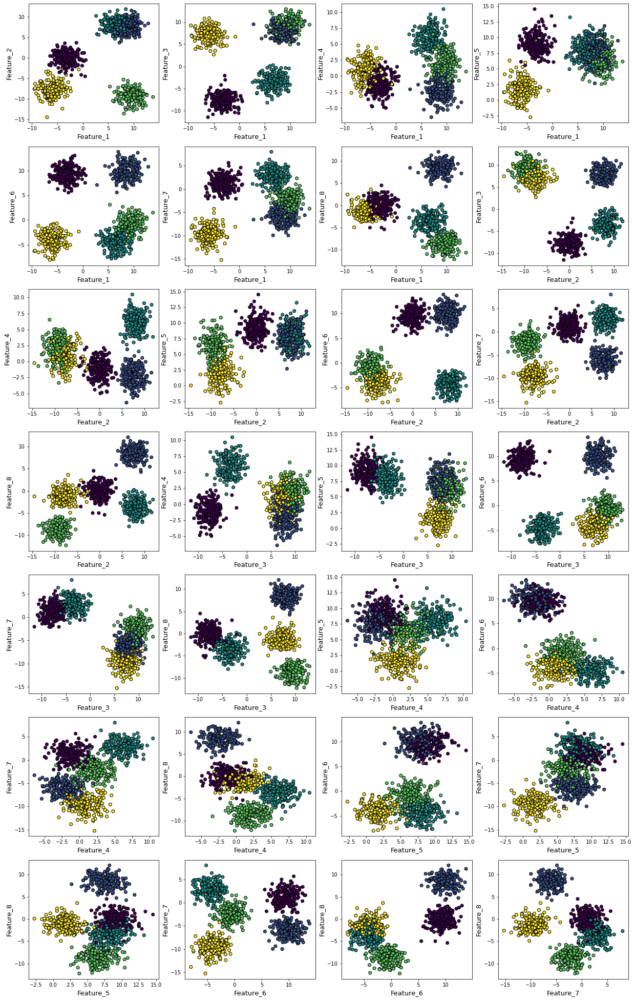

In [19]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=data1[1],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [20]:
df1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Feature_1,1000.0,3.166456,6.599977,-9.493057,-3.806972,6.450308,8.860103,13.798582
Feature_2,1000.0,-0.272618,7.500014,-14.487388,-8.020567,-0.006525,7.386113,11.860946
Feature_3,1000.0,2.713123,7.074391,-11.488875,-4.323795,6.521412,8.606294,12.961516
Feature_4,1000.0,1.097578,3.262699,-6.438767,-1.407630,0.702445,3.291660,10.464535
Feature_5,1000.0,6.567086,2.996789,-2.738168,5.175193,7.254932,8.638701,14.533261
Feature_6,1000.0,2.022637,6.493964,-8.029612,-3.694760,-0.754920,9.119391,13.790627
Feature_7,1000.0,-2.761776,4.790595,-15.246620,-6.743660,-2.281268,1.542981,8.009930
Feature_8,1000.0,-1.021335,5.735757,-12.274510,-4.762521,-1.556984,1.232720,12.062021


### How are the classes separated (boxplots)

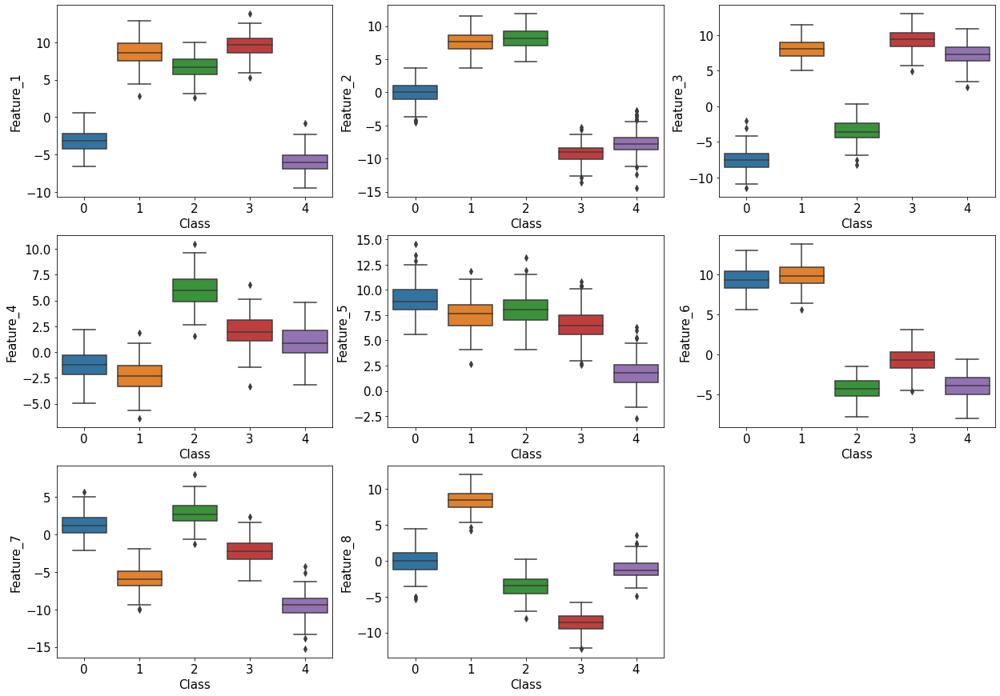

In [21]:
plt.figure(figsize=(21,15))
for i,c in enumerate(df1.columns):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df1[c],x=data1[1])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Class",fontsize=15)
    plt.ylabel(c,fontsize=15)
    #plt.show()

## k-means clustering

In [22]:
from sklearn.cluster import KMeans

### Unlabled data

In [23]:
X=df1

In [24]:
X.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,10.261482,-9.951077,9.393097,0.372536,4.523046,-1.920748,-1.198146,-8.024560
1,8.093297,5.179383,8.481361,-0.517582,7.288024,10.502873,-7.241583,7.653740
2,-7.660215,-7.987983,8.545370,0.833773,2.274125,-2.384354,-9.829458,-0.363279
3,11.211121,-8.219755,10.666822,-0.829995,7.601960,0.888086,-2.001333,-5.998661
4,-5.156091,-0.817788,-7.167059,-0.812713,11.454445,10.817756,0.204278,-0.484251


In [25]:
y=data1[1]

### Scaling

In [26]:
from sklearn.preprocessing import MinMaxScaler

In [27]:
scaler = MinMaxScaler()

In [28]:
X_scaled=scaler.fit_transform(X)

### Metrics

In [29]:
from sklearn.metrics import silhouette_score, adjusted_rand_score, completeness_score, v_measure_score

### Running k-means and computing inter-cluster distance score for various *k* values

In [30]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -325.2326345198832
Silhouette score for number of cluster(s) 2: 0.37898525863872384
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -204.65163997116287
Silhouette score for number of cluster(s) 3: 0.5029020167805683
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -113.46806044418932
Silhouette score for number of cluster(s) 4: 0.6159414087856722
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -38.57084667253432
Silhouette score for number of cluster(s) 5: 0.7160973796232131
V-measure score for number of cluster(

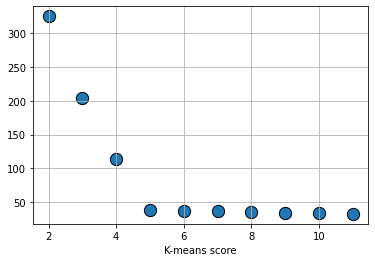

In [31]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means score")
plt.show()

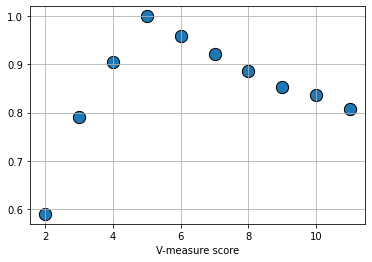

In [32]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measure score")
plt.show()

In [33]:
km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)

In [34]:
preds_km = km.predict(X_scaled)

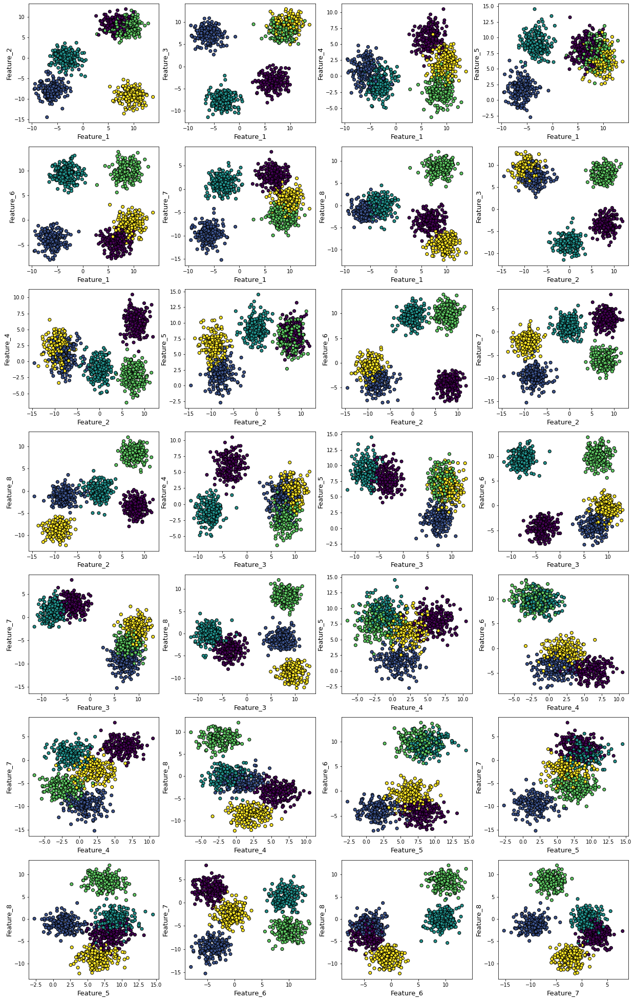

In [35]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Expectation-maximization (Gaussian Mixture Model)

https://rubialesalberto.medium.com/clustering-con-gaussian-mixture-model-en-sklearn-y-sus-par%C3%A1metros-aplicado-al-marketing-74b9d8454b86

In [36]:
from sklearn.mixture import GaussianMixture

In [37]:
gm_bic= []
gm_score=[]
for i in range(2,12):
    gm = GaussianMixture(n_components=i,n_init=10,tol=1e-3,max_iter=1000).fit(X_scaled)
    print("BIC for number of cluster(s) {}: {}".format(i,gm.bic(X_scaled)))
    print("Log-likelihood score for number of cluster(s) {}: {}".format(i,gm.score(X_scaled)))
    print("-"*100)
    gm_bic.append(-gm.bic(X_scaled))
    gm_score.append(gm.score(X_scaled))

BIC for number of cluster(s) 2: -12501.734413918599
Log-likelihood score for number of cluster(s) 2: 6.558262316874004
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 3: -14339.033432560589
Log-likelihood score for number of cluster(s) 3: 7.632336319972098
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 4: -15103.559770113758
Log-likelihood score for number of cluster(s) 4: 8.17002398252578
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 5: -15845.305365585296
Log-likelihood score for number of cluster(s) 5: 8.696321274038649
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 6: -15597.180923276383
Log-likelihood score for number of cluster(s) 6: 8.727683546661288
--

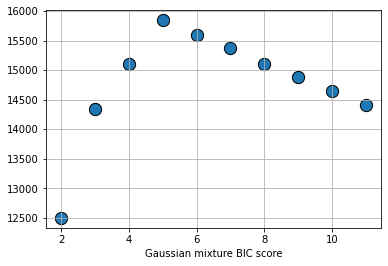

In [38]:
plt.scatter(x=[i for i in range(2,12)],y=gm_bic,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Gaussian mixture BIC score")
plt.show()

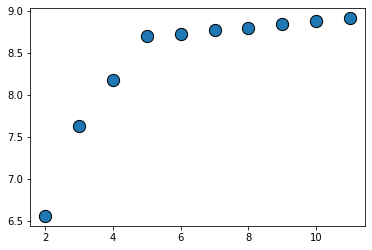

In [39]:
plt.scatter(x=[i for i in range(2,12)],y=gm_score,s=150,edgecolor='k')
plt.show()

In [40]:
gm = GaussianMixture(n_components=5,verbose=1,n_init=10,tol=1e-2,covariance_type='full',max_iter=1000).fit(X_scaled)

Initialization 0
Initialization converged: True
Initialization 1
Initialization converged: True
Initialization 2
Initialization converged: True
Initialization 3
Initialization converged: True
Initialization 4
Initialization converged: True
Initialization 5
Initialization converged: True
Initialization 6
Initialization converged: True
Initialization 7
Initialization converged: True
Initialization 8
Initialization converged: True
Initialization 9
Initialization converged: True


In [41]:
gm.means_

array([[0.69417849, 0.85901566, 0.32710477, 0.73720626, 0.62501223,
        0.16634192, 0.77577197, 0.35769879],
       [0.15159064, 0.25548585, 0.76679931, 0.43402471, 0.25646091,
        0.18524743, 0.2454406 , 0.45475294],
       [0.78017635, 0.83858142, 0.79719025, 0.24543562, 0.59561478,
        0.82069063, 0.39888395, 0.84911709],
       [0.27325788, 0.54625918, 0.15747544, 0.30863665, 0.68346113,
        0.79570035, 0.70841893, 0.50036716],
       [0.81840551, 0.19812811, 0.85567784, 0.50394901, 0.53327952,
        0.33544282, 0.55564092, 0.15005651]])

In [42]:
km.cluster_centers_

array([[0.69417849, 0.85901566, 0.32710477, 0.73720626, 0.62501223,
        0.16634192, 0.77577197, 0.35769879],
       [0.15159064, 0.25548585, 0.76679931, 0.43402471, 0.25646091,
        0.18524743, 0.2454406 , 0.45475294],
       [0.27325788, 0.54625918, 0.15747544, 0.30863665, 0.68346113,
        0.79570035, 0.70841893, 0.50036716],
       [0.78017635, 0.83858142, 0.79719025, 0.24543562, 0.59561478,
        0.82069063, 0.39888395, 0.84911709],
       [0.81840551, 0.19812811, 0.85567784, 0.50394901, 0.53327952,
        0.33544282, 0.55564092, 0.15005651]])

In [43]:
gm.means_/km.cluster_centers_

array([[1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        ],
       [1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        ],
       [2.85509181, 1.5351347 , 5.06231486, 0.79522514, 0.8714684 ,
        1.03140664, 0.56306224, 1.69698805],
       [0.35025143, 0.65140864, 0.19753809, 1.25750552, 1.14748854,
        0.9695497 , 1.77600259, 0.58927934],
       [1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        ]])

In [44]:
preds_gm=gm.predict(X_scaled)

In [45]:
km_rand_score = adjusted_rand_score(preds_km,y)

In [46]:
gm_rand_score = adjusted_rand_score(preds_gm,y)

In [47]:
print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)

Adjusted Rand score for k-means 1.0
Adjusted Rand score for Gaussian Mixture model 1.0


In [48]:
silhouette_score(X_scaled,preds_km)

0.7160973796232131

In [49]:
silhouette_score(X_scaled,preds_gm)

0.7160973796232131

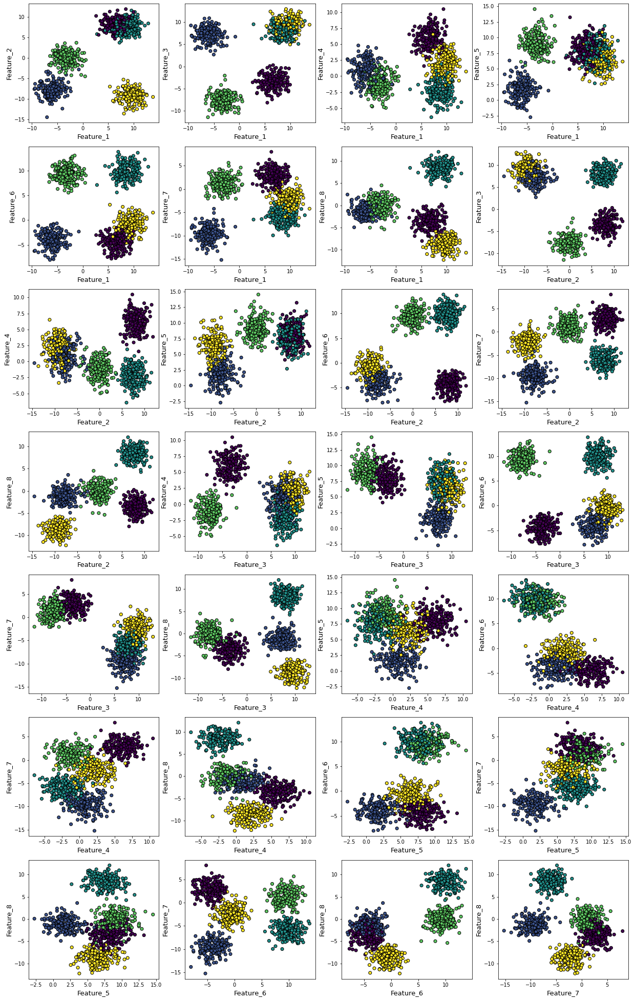

In [50]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## PCA

In [51]:
from sklearn.decomposition import PCA

In [52]:
n_prin_comp = 3

In [53]:
pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
pca_partial.fit(X_scaled)

PCA(n_components=3, svd_solver='full')

In [54]:
pca_full = PCA(n_components=n_features,svd_solver='full')
pca_full.fit(X_scaled)

PCA(n_components=8, svd_solver='full')

### How much variance is explained by principal components?

With the help of this plot, we can decide to work with only the first 3 principal components

In [55]:
pca_explained_var = pca_full.explained_variance_ratio_

In [56]:
cum_explaiend_var = pca_explained_var.cumsum()

In [57]:
cum_explaiend_var

array([0.37018238, 0.63639323, 0.85086819, 0.95726015, 0.97156771,
       0.98510903, 0.99274762, 1.        ])

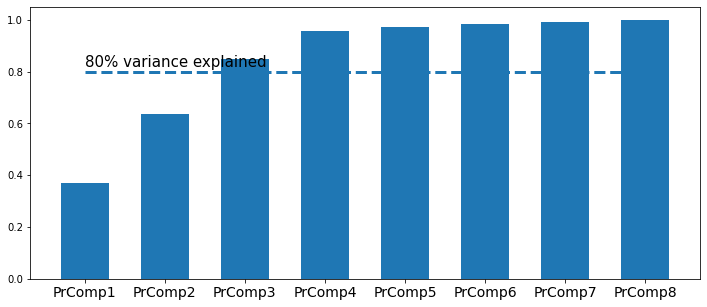

In [58]:
plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,9)],height=cum_explaiend_var,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.show()

### Transform the original variables in principal component space and create a DataFrame

In [59]:
X_pca = pca_partial.fit_transform(X_scaled)

In [60]:
df_pca=pd.DataFrame(data=X_pca,columns=['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])

### Running k-means on the transformed features

In [61]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_pca)))
    km_scores.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -252.8314888481893
Silhouette score for number of cluster(s) 2: 0.4433707270240496
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -133.62714433492076
Silhouette score for number of cluster(s) 3: 0.5966297524668775
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -60.78516097618609
Silhouette score for number of cluster(s) 4: 0.7091284379328131
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -13.23783650628215
Silhouette score for number of cluster(s) 5: 0.8075174049102826
V-measure score for number of cluster(s)

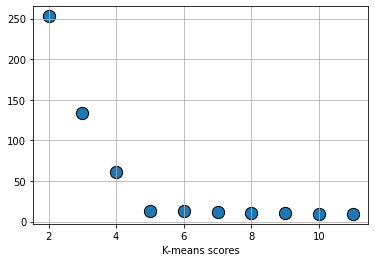

In [62]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means scores")
plt.show()

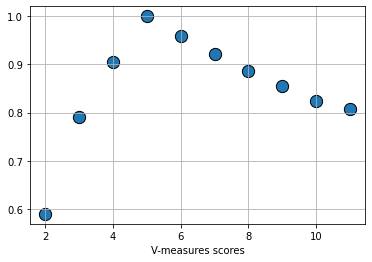

In [63]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measures scores")
plt.show()

### K-means fitting with PCA-transformed data

In [64]:
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
preds_km_pca = km_pca.predict(X_pca)

### Visualizing the clusters after running k-means on PCA-transformed features

In [65]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)

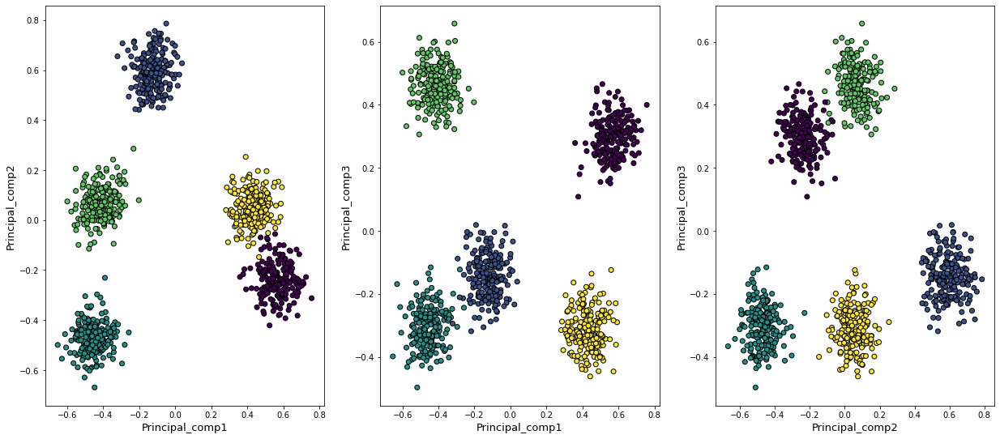

In [66]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## ICA

In [67]:
from sklearn.decomposition import FastICA

In [68]:
n_ind_comp = 3

In [69]:
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(n_components=3)

In [70]:
ica_full = FastICA(max_iter=1000)
ica_full.fit(X_scaled)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\decomposition\_fastica.py:116: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


FastICA(max_iter=1000)

In [71]:
X_ica = ica_partial.fit_transform(X_scaled)

In [72]:
df_ica=pd.DataFrame(data=X_ica,columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])

### Running k-means on the independent features

In [73]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_ica)))
    km_scores.append(-km.score(X_ica))
    silhouette = silhouette_score(X_ica,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -2.028167416184045
Silhouette score for number of cluster(s) 2: 0.3931839976171006
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -1.1184416281185963
Silhouette score for number of cluster(s) 3: 0.5654881200700749
V-measure score for number of cluster(s) 3: 0.7918756684685213
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -0.5137648383333704
Silhouette score for number of cluster(s) 4: 0.682981609172824
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -0.09764100207284217
Silhouette score for number of cluster(s) 5: 0.8123773991968944
V-measure score for number of cluster(

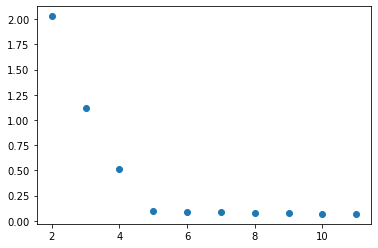

In [74]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

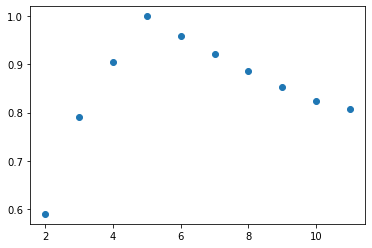

In [75]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### K-means fitting with ICA-transformed data

In [76]:
km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
preds_km_ica = km_ica.predict(X_ica)

### Visualizing the clusters after running k-means on ICA-transformed features

In [77]:
col_ica_combi=list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

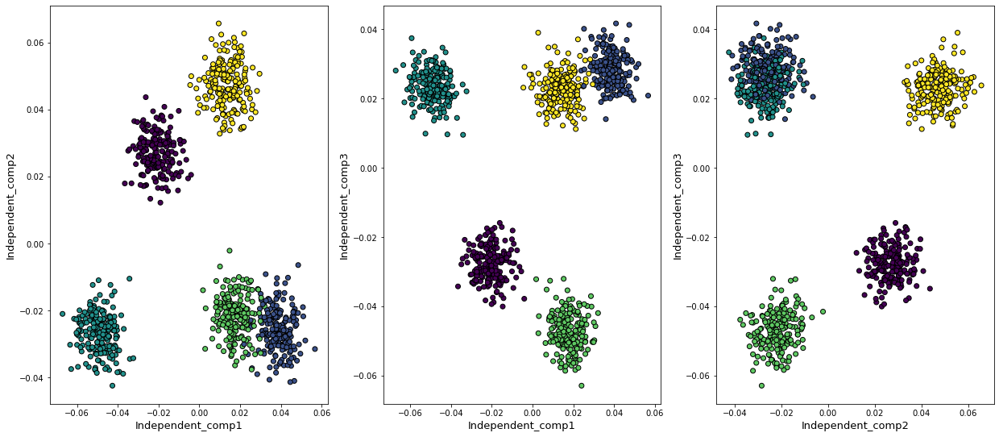

In [78]:
plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Random Projection

In [79]:
from sklearn.random_projection import GaussianRandomProjection

In [80]:
n_random_comp = 3

In [81]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [82]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [83]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

### Running k-means on random projections

In [84]:
km_scores= []
km_silhouette = []
vmeasure_score = []
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_random_proj)))
    km_scores.append(-km.score(X_random_proj))
    silhouette = silhouette_score(X_random_proj,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -111.81374780999538
Silhouette score for number of cluster(s) 2: 0.5855393714119778
V-measure score for number of cluster(s) 2: 0.4466938229319074
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -73.19856953500512
Silhouette score for number of cluster(s) 3: 0.4274655833654388
V-measure score for number of cluster(s) 3: 0.6607323851400961
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -55.28583489588525
Silhouette score for number of cluster(s) 4: 0.41125480770290224
V-measure score for number of cluster(s) 4: 0.6915823413320662
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -39.055153490294344
Silhouette score for number of cluster(s) 5: 0.4633027649087593
V-measure score for number of cluster

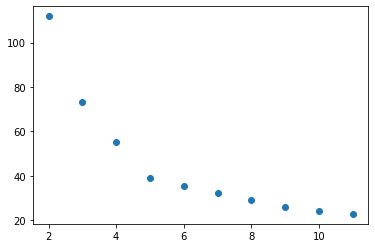

In [85]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

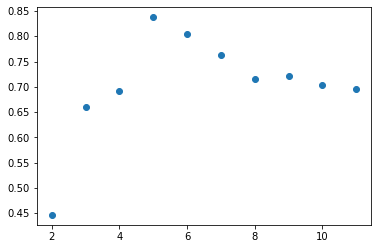

In [86]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### K-means fitting with random-projected data

In [87]:
km_random_proj = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
preds_km_random_proj = km_random_proj.predict(X_random_proj)

### Visualizing the clusters after running k-means on random-projected features

In [88]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

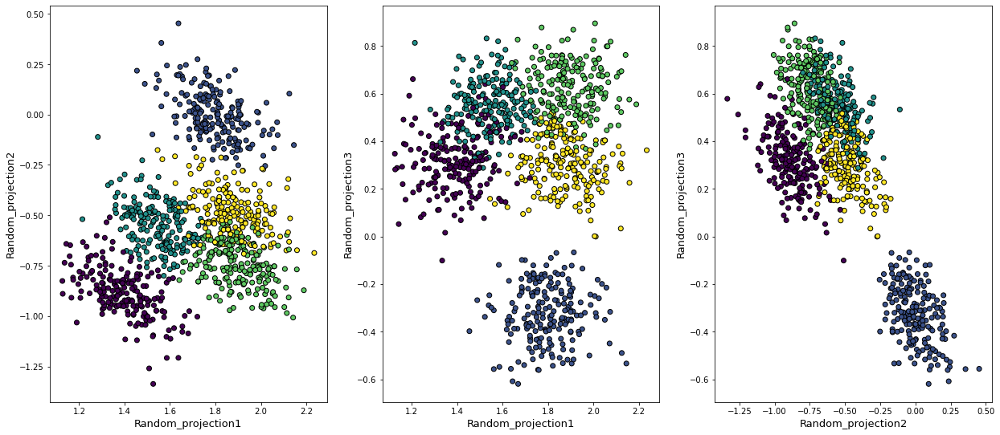

In [89]:
plt.figure(figsize=(21,20))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

In [90]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

### Running the random projections many times

Score for iteration 0: -48.69327742776401
Silhouette score for iteration 0: 0.6316851050637409
V-measure score for iteration 0: 0.9546542607677497
----------------------------------------------------------------------------------------------------


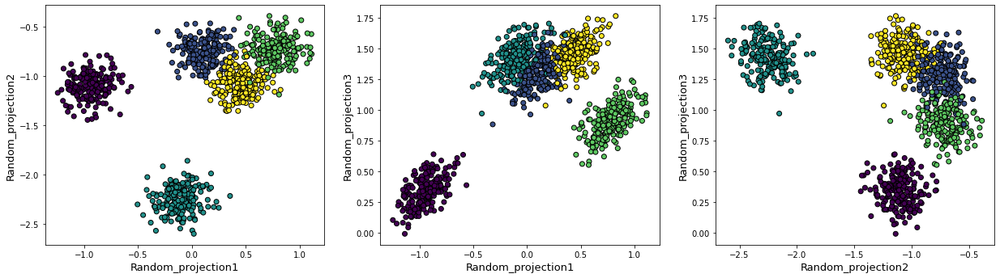

Score for iteration 1: -51.4391996551515
Silhouette score for iteration 1: 0.6880050470564515
V-measure score for iteration 1: 0.9891274791546505
----------------------------------------------------------------------------------------------------


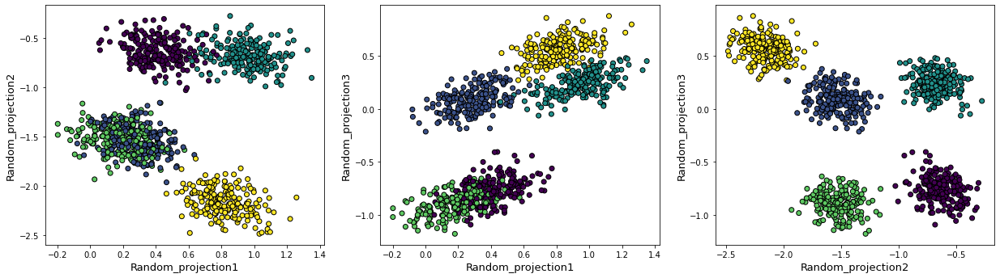

Score for iteration 2: -43.9124377612554
Silhouette score for iteration 2: 0.5410048251064624
V-measure score for iteration 2: 0.9242068552200791
----------------------------------------------------------------------------------------------------


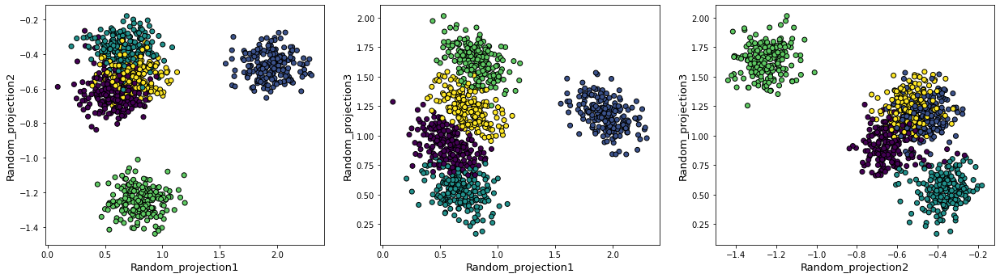

Score for iteration 3: -35.21300252620166
Silhouette score for iteration 3: 0.7247595934780949
V-measure score for iteration 3: 1.0
----------------------------------------------------------------------------------------------------


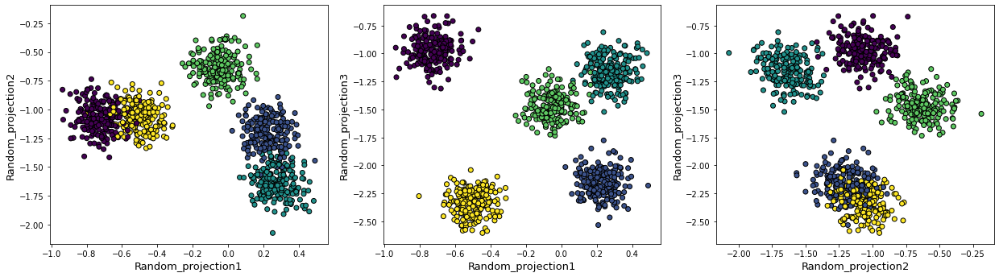

Score for iteration 4: -28.74493330270748
Silhouette score for iteration 4: 0.654861360742528
V-measure score for iteration 4: 0.996086631901329
----------------------------------------------------------------------------------------------------


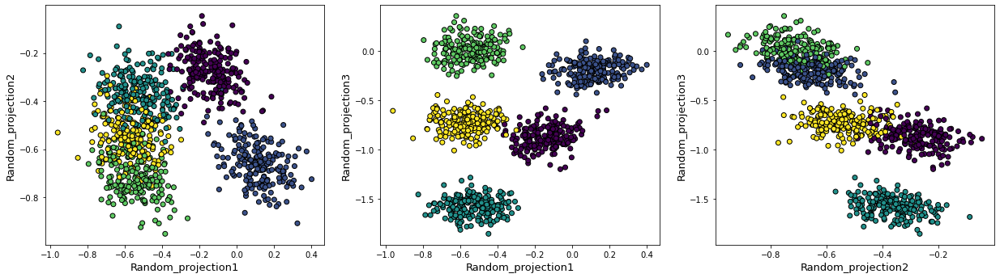

Score for iteration 5: -41.422241806233025
Silhouette score for iteration 5: 0.4153556748835395
V-measure score for iteration 5: 0.8138206069880387
----------------------------------------------------------------------------------------------------


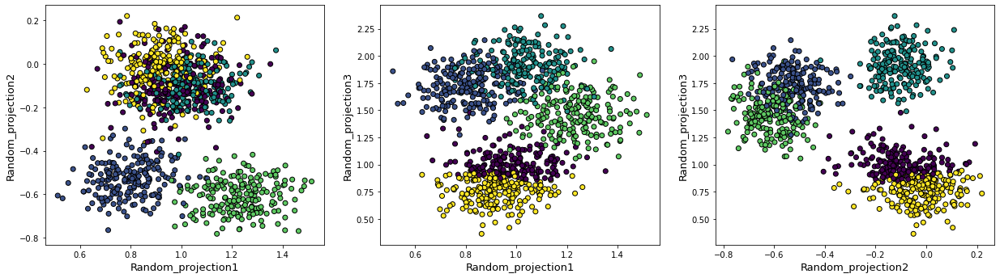

Score for iteration 6: -39.894847358426055
Silhouette score for iteration 6: 0.5948023368376271
V-measure score for iteration 6: 0.9640370878088032
----------------------------------------------------------------------------------------------------


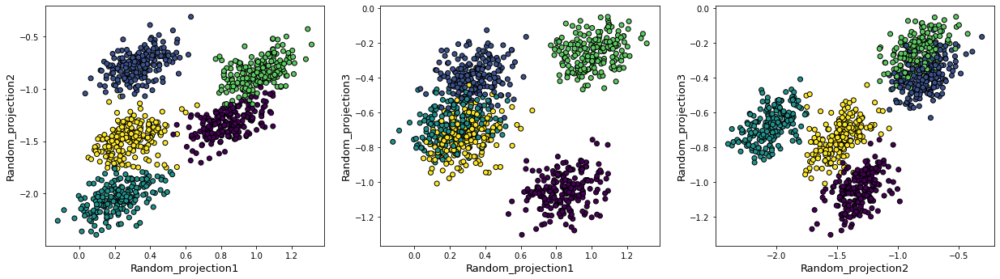

Score for iteration 7: -35.58557205506196
Silhouette score for iteration 7: 0.5563909898719508
V-measure score for iteration 7: 0.8723698908501784
----------------------------------------------------------------------------------------------------


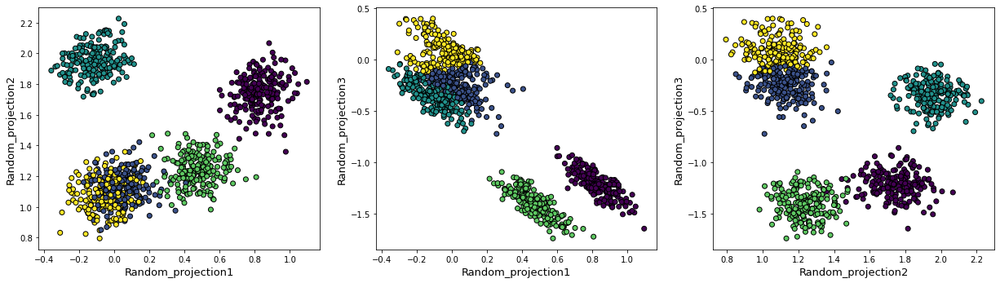

Score for iteration 8: -42.22503507939206
Silhouette score for iteration 8: 0.4947181263270922
V-measure score for iteration 8: 0.8829648957982689
----------------------------------------------------------------------------------------------------


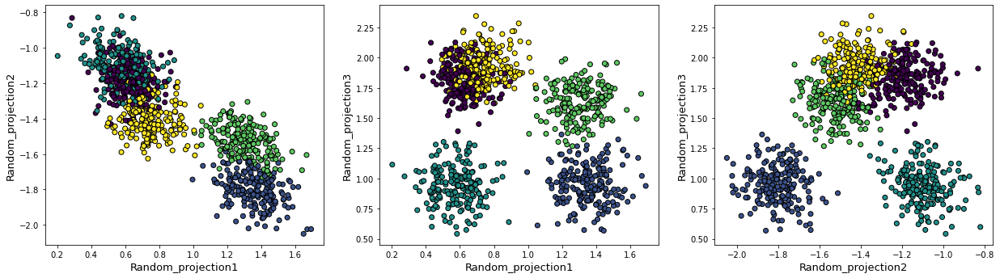

Score for iteration 9: -33.003021326790716
Silhouette score for iteration 9: 0.6261869872634344
V-measure score for iteration 9: 0.9576236577004635
----------------------------------------------------------------------------------------------------


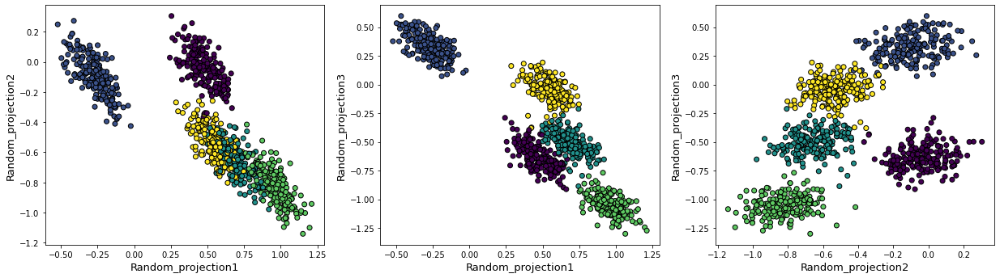

Score for iteration 10: -49.859510894881424
Silhouette score for iteration 10: 0.4515188132243421
V-measure score for iteration 10: 0.8075144603349925
----------------------------------------------------------------------------------------------------


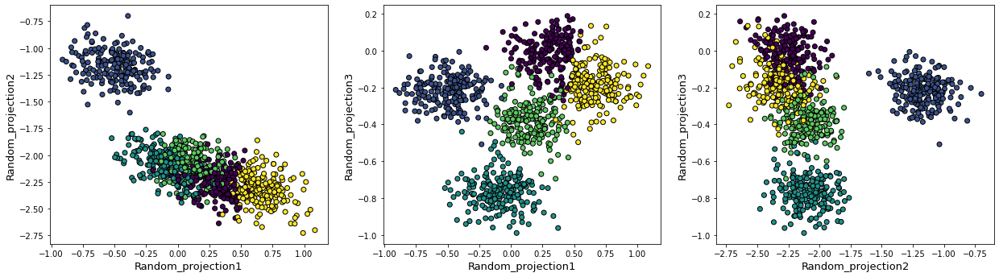

Score for iteration 11: -32.52628077890142
Silhouette score for iteration 11: 0.6025809369320657
V-measure score for iteration 11: 0.9514028796496626
----------------------------------------------------------------------------------------------------


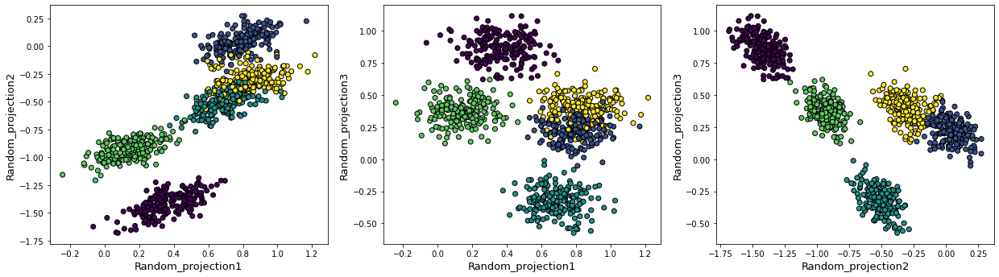

Score for iteration 12: -74.1230844860696
Silhouette score for iteration 12: 0.4983427426688047
V-measure score for iteration 12: 0.8348709094328334
----------------------------------------------------------------------------------------------------


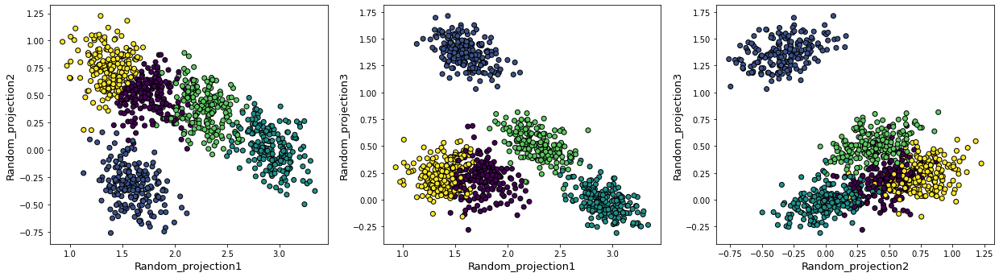

Score for iteration 13: -21.621019106850273
Silhouette score for iteration 13: 0.5919345649671316
V-measure score for iteration 13: 0.9130196911798145
----------------------------------------------------------------------------------------------------


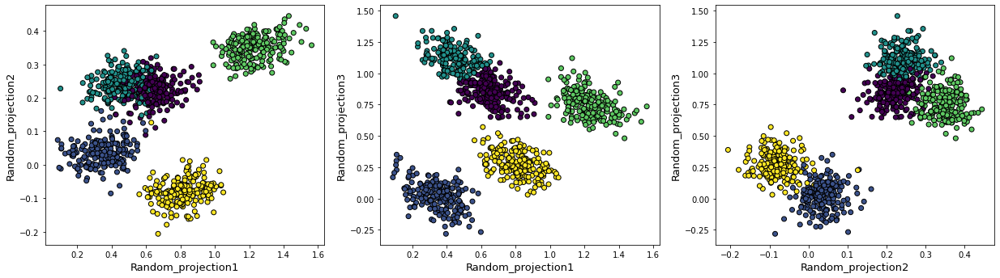

Score for iteration 14: -42.785494765805126
Silhouette score for iteration 14: 0.4573573764679636
V-measure score for iteration 14: 0.8807911545512002
----------------------------------------------------------------------------------------------------


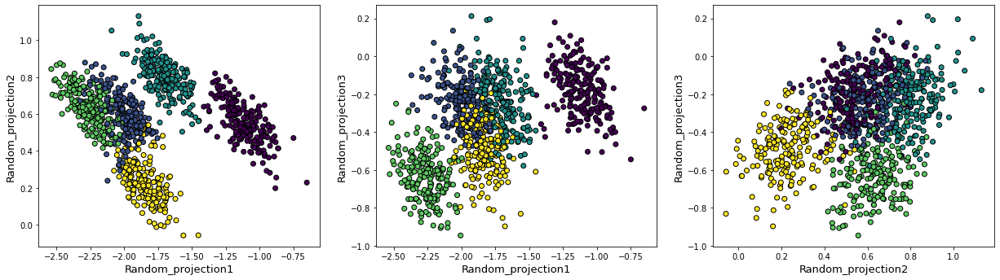

Score for iteration 15: -34.93665660351083
Silhouette score for iteration 15: 0.5018363135756058
V-measure score for iteration 15: 0.861827402762099
----------------------------------------------------------------------------------------------------


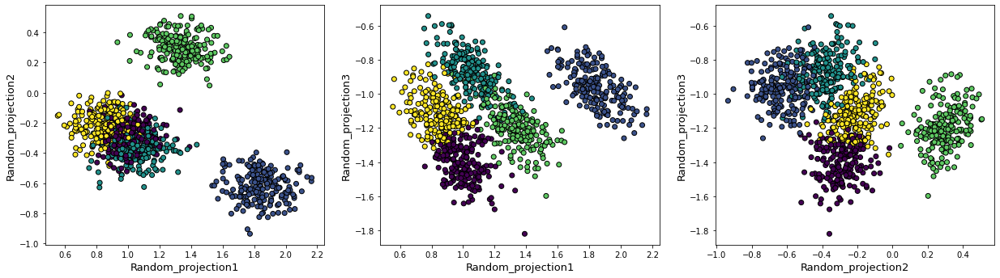

Score for iteration 16: -45.39955548248569
Silhouette score for iteration 16: 0.6074210321716683
V-measure score for iteration 16: 0.9782627720330576
----------------------------------------------------------------------------------------------------


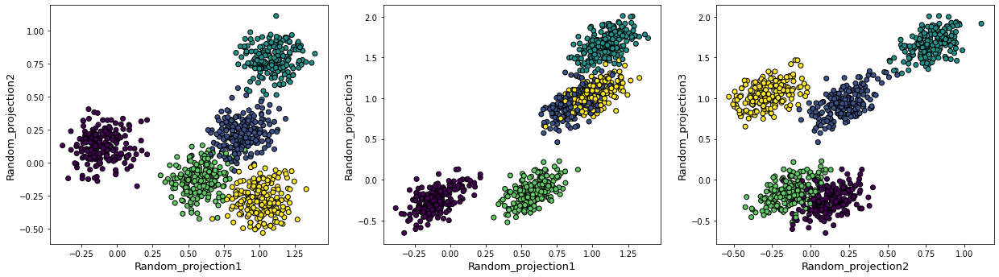

Score for iteration 17: -30.544961562334336
Silhouette score for iteration 17: 0.5140237338582963
V-measure score for iteration 17: 0.8807032599452251
----------------------------------------------------------------------------------------------------


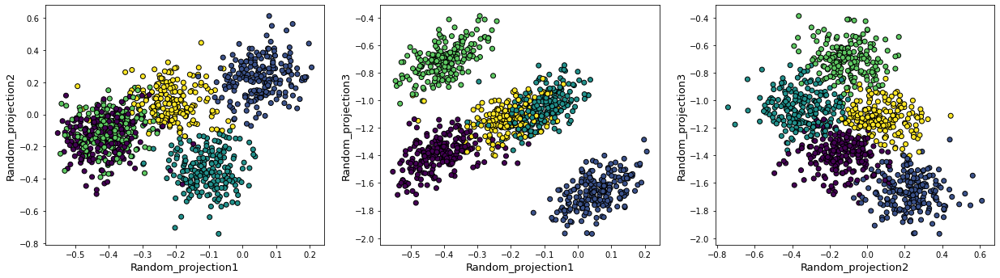

Score for iteration 18: -26.382391810133534
Silhouette score for iteration 18: 0.5812759707590653
V-measure score for iteration 18: 0.973489544011331
----------------------------------------------------------------------------------------------------


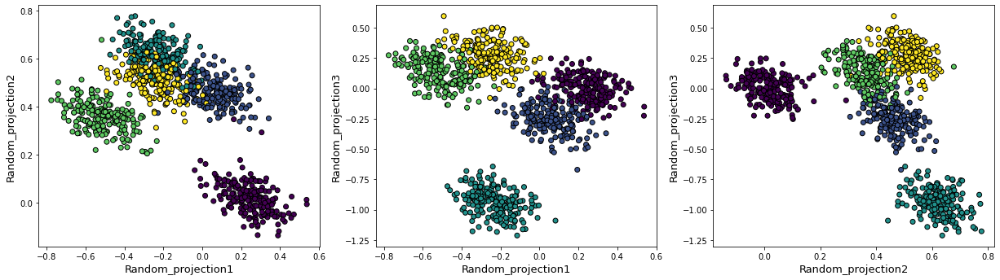

Score for iteration 19: -38.55220715496491
Silhouette score for iteration 19: 0.6637887681444691
V-measure score for iteration 19: 0.983890960343428
----------------------------------------------------------------------------------------------------


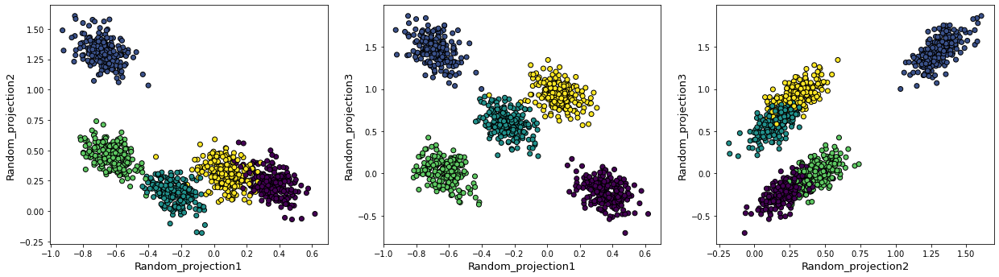

In [91]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []
for i in range(20):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)
    
    plot_cluster_rp(df_random_proj,preds)

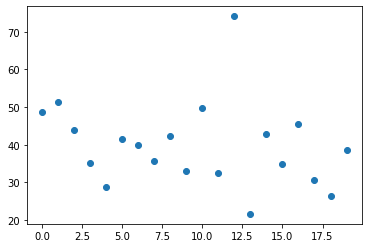

In [92]:
plt.scatter(x=[i for i in range(20)],y=rp_score)
plt.show()

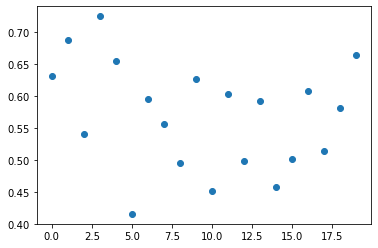

In [93]:
plt.scatter(x=[i for i in range(20)],y=rp_silhouette)
plt.show()

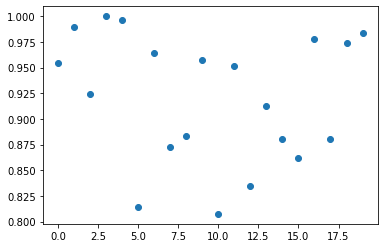

In [94]:
plt.scatter(x=[i for i in range(20)],y=rp_vmeasure)
plt.show()

### This kind of variation does not happen with PCA

In [95]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    rp_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

Score for iteration 0: -13.23783650628215
Silhouette score for iteration 0: 0.8075174049102826
V-measure score for iteration 0: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 1: -13.237836506282148
Silhouette score for iteration 1: 0.8075174049102826
V-measure score for iteration 1: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 2: -13.23783650628215
Silhouette score for iteration 2: 0.8075174049102826
V-measure score for iteration 2: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 3: -13.23783650628215
Silhouette score for iteration 3: 0.8075174049102826
V-measure score for iteration 3: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 4: -13.23783650628215
Silhouette score for iter